**Class Project U2. Part 01.**

Made by: Cristian Misael Torres Martínez

Control number: M25290060

**The k-armed bandit problem**

The k-armed bandit problem is a classic reinforcement learning challenge that explores the fundamental trade-off between exploration and exploitation.

**1. Problem**: In this project, the objective is to maximize children's engagement in an educational video game by selecting one of 10 different adaptive gameplay models before each session. Each adaptive model represents an action in the 10-armed bandit problem and modifies the game in a specific way, such as adjusting difficulty progression, reward frequency, feedback style, narrative intensity, time pressure, or level complexity. After a child completes a session, the agent receives a reward corresponding to an engagement metric, for example a composite score based on time spent playing, task completion rate, voluntary continuation, or in-game interaction frequency. Each adaptive model has an unknown true average effect on engagement, and variability occurs due to differences in individual preferences and behavior among children, meaning that rewards follow a stationary probability distribution. The agent's goal is to learn, through repeated interactions and observed engagement outcomes, which adaptive model produces the highest average engagement, balancing exploration of different adaptations with exploitation of those that appear to be most effective.

**2.** This project, the reward associated with each of the 10 adaptive gameplay models is defined as a stationary normal probability distribution representing the engagement level generated after a game session. The reward values are continuous and bounded conceptually between 0 and 1, where higher values indicate greater engagement. Each action afollows a distribution Ra∼N(μa,σ^2)with a fixed variance σ^2 = 0.01(i.e., σ = 0.1), and the mean engagement values are different for each adaptive model. Specifically, the true means are: action 1 = 0.20, action 2 = 0.55, action 3 = 0.62, action 4 = 0.30, action 5 = 0.75, action 6 = 0.50, action 7 = 0.66, action 8 = 0.59, action 9 = 0.45, and action 10 = 0.53. These distributions are stationary, meaning they do not change over time, and their true mean values are unknown to the agent. The objective of the agent is to estimate these action values through interaction and observed rewards in order to identify the adaptive model that maximizes average engagement.

In [ ]:
# Class type for the engagement experiment
# Second version by JAGR (M1lotting data).
# Sample average method to update action-values (Q-values).

import random

class model:
    def __init__(self, name, real_prob):
        # Constructor: it executes when you create a new model
        # Here we define the initial states of the model. Attributes.
        self.name = name
        self.real_prob = real_prob

        self.q_value = 0.0  # Initial estimate of the value of the model
        self.count = 0      # Number of times the model has been used
        self.accum_reward = 0.0  # Total reward obtained from this model

    def try_model(self):
        # Simulate trying the model
        if random.random() < self.real_prob:
            return 1  # Reward of 1 if successful
        else:
            return 0  # Reward of 0 if not successful

    def learn(self, reward):
        # Update the Q-value based on the received reward
        self.count += 1
        self.accum_reward += reward
        if self.count > 0:
            self.q_value = self.accum_reward / self.count  # Update Q-value as average reward

    def __str__(self):
        return f"model {self.name} -> Q: {self.q_value:.4f} (Chosen {self.count} times)"

In [ ]:
%pip install nbformat

In [ ]:
import numpy as np

models = [
    model("M1", 0.20),
    model("M2", 0.55),
    model("M3", 0.62),
    model("M4", 0.30),
    model("M5", 0.75),
    model("M6", 0.50),
    model("M7", 0.66),
    model("M8", 0.59),
    model("M9", 0.45),
    model("M10", 0.53)
    ]

tried_models_history = []                              # To record history of tried models
q_values_history = []                                   # To record history of Q-values
accumulated_rewards_history = []                        # To record accumulated rewards

n_steps = 10000
for t in range(1, n_steps+1):
    selected_model = random.choice(models)
    reward = selected_model.try_model()
    selected_model.learn(reward)
    tried_models_history.append(selected_model.name)
    q_values_history.append([i.q_value for i in models])
    accumulated_rewards_history.append([j.accum_reward for j in models])
    #print(f"Iteration {t}: Tried model {selected_model.name}, Reward: {reward}, Q-value: {selected_model.q_value:.4f}, Count: {selected_model.count}, Accumulated Reward: {selected_model.accum_reward}")

#for i in models:
 #   print(i)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Definición de parámetros
n_actions = 10
true_means = [0.20, 0.55, 0.62, 0.30, 0.75, 0.50, 0.66, 0.59, 0.45, 0.53]
std_dev = 0.1  # dado que sigma^2 = 0.01

# Simulación para visualización: Generamos 1000 muestras por acción
data = [np.random.normal(m, std_dev, 1000) for m in true_means]

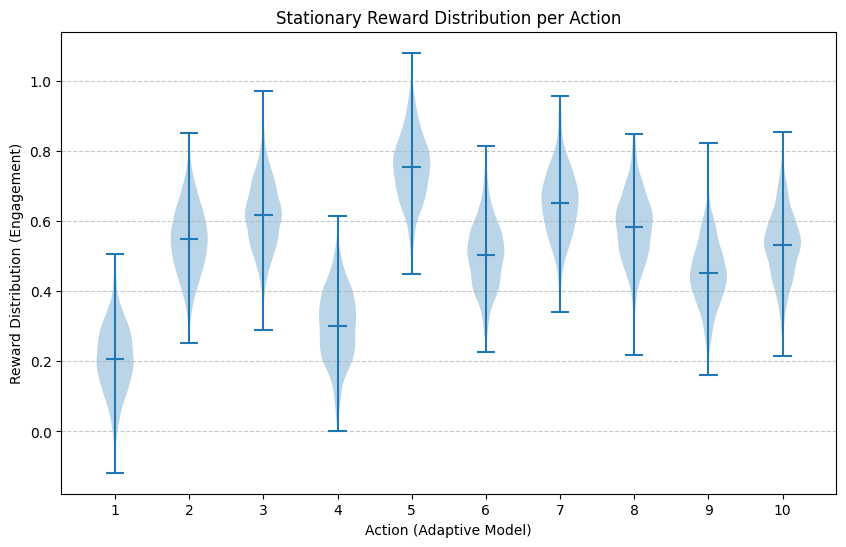

In [ ]:
plt.figure(figsize=(10, 6))
plt.violinplot(data, showmeans=True)
plt.xlabel('Action (Adaptive Model)')
plt.ylabel('Reward Distribution (Engagement)')
plt.title('Stationary Reward Distribution per Action')
plt.xticks(range(1, 11))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [ ]:
def run_simulation(n_steps):

    models = [
        model("M1", 0.20),
        model("M2", 0.55),
        model("M3", 0.62),
        model("M4", 0.30),
        model("M5", 0.75),
        model("M6", 0.50),
        model("M7", 0.66),
        model("M8", 0.59),
        model("M9", 0.45),
        model("M10", 0.53)
    ]

    tried_models_history = []
    q_values_history = []
    accumulated_rewards_history = []

    for t in range(1, n_steps+1):

        selected_model = random.choice(models)
        reward = selected_model.try_model()
        selected_model.learn(reward)

        tried_models_history.append(selected_model.name)
        q_values_history.append([i.q_value for i in models])
        accumulated_rewards_history.append([j.accum_reward for j in models])

    return models, tried_models_history, q_values_history, accumulated_rewards_history

In [ ]:
_, hist_500,_,_ = run_simulation(500)
_, hist_1000,_,_ = run_simulation(1000)
_, hist_5000,_,_ = run_simulation(5000)
_, hist_10000,_,_ = run_simulation(10000)

In [ ]:
import plotly.graph_objects as go

def plot_histogram(data, steps):

    fig = go.Figure()

    fig.add_trace(go.Histogram(
        x=data
    ))

    fig.update_layout(
        title=f"Histogram of tried models ({steps} steps)",
        xaxis_title="Model",
        yaxis_title="Number of tried times",
        template="plotly_white",

        xaxis=dict(
            categoryorder='array',
            categoryarray=['M1','M2','M3','M4','M5','M6','M7','M8','M9','M10']
        )
    )

    fig.show()


plot_histogram(hist_500, 500)
plot_histogram(hist_1000, 1000)
plot_histogram(hist_5000, 5000)
plot_histogram(hist_10000, 10000)

In [ ]:
import plotly.graph_objects as go
import numpy as np

def plot_q(models, q_values_history, n_steps):

    q_values_arr = np.array(q_values_history)
    steps = list(range(1, n_steps + 1))

    fig2 = go.Figure()

    for i, m in enumerate(models):
        fig2.add_trace(go.Scatter(
            x=steps,
            y=q_values_arr[:, i],
            mode='lines',
            name=f'model {m.name}'
        ))

    fig2.update_layout(
        title=f'Qt(a) estimation over Time - {n_steps} steps',
        xaxis_title='Simulation Steps',
        yaxis_title='Q-values',
        template='plotly_white',
        hovermode='x unified'
    )

    fig2.show()

In [ ]:
for steps in [500, 1000, 5000, 10000]:

    models, _, q_history,_ = run_simulation(steps)

    plot_q(models, q_history, steps)

In [ ]:
import plotly.graph_objects as go
import numpy as np

def plot_accum_rewards(models, accumulated_rewards_history, n_steps):

    acc_rewards_arr = np.array(accumulated_rewards_history)
    steps = list(range(1, n_steps + 1))

    fig3 = go.Figure()

    for i, m in enumerate(models):
        fig3.add_trace(go.Scatter(
            x=steps,
            y=acc_rewards_arr[:, i],
            mode='lines',
            name=f'model {m.name}'
        ))

    fig3.update_layout(
        title=f'Accumulated Rewards - {n_steps} steps',
        xaxis_title='Simulation Steps',
        yaxis_title='Accumulated Rewards',
        template='plotly_white',
        hovermode='x unified'
    )

    fig3.show()

In [ ]:
for steps in [500, 1000, 5000, 10000]:

    models, q_hist, _, acc_hist = run_simulation(steps)

    plot_accum_rewards(models, acc_hist, steps)

In [ ]:
import numpy as np
import random
import plotly.graph_objects as go

n_runs = 2000
n_steps = 10000

optimal_action_counts = np.zeros(n_steps)

def run_simulation_steps(n_steps, n_runs=2000):

    optimal_action_counts = np.zeros(n_steps)

    for run in range(n_runs):

        models = [
            model("M1", 0.20),
            model("M2", 0.55),
            model("M3", 0.62),
            model("M4", 0.30),
            model("M5", 0.75),
            model("M6", 0.50),
            model("M7", 0.66),
            model("M8", 0.59),
            model("M9", 0.45),
            model("M10", 0.53)
        ]

        for t in range(n_steps):

            selected_model = random.choice(models)

            reward = selected_model.try_model()
            selected_model.learn(reward)

            if selected_model.name == "M5":
                optimal_action_counts[t] += 1

    return (optimal_action_counts / n_runs) * 100


In [ ]:
def plot_result(data, steps):

    fig = go.Figure()

    fig.add_trace(go.Scatter(
        y=data,
        mode='lines',
        name=f"{steps} steps"
    ))

    fig.update_layout(
        title=f"Optimal Action % ({steps} steps)",
        xaxis_title="Steps",
        yaxis_title="% Optimal Action",
        template="plotly_white"
    )

    fig.show()

In [ ]:
steps_500 = run_simulation_steps(500)
steps_1000 = run_simulation_steps(1000)
steps_5000 = run_simulation_steps(5000)
steps_10000 = run_simulation_steps(10000)

In [ ]:

plot_result(steps_500, 500)
plot_result(steps_1000, 1000)
plot_result(steps_5000, 5000)
plot_result(steps_10000, 10000)

**4.** For the next agent, we will be exploring a greedy approach, wich thoeretically exploits the action of greatest value, but as we will see, the results may very depending on the q values we assign to the agent, depending on the q value, the agent will explore more or not explore at all (for 500, 1000, 5000 and 10000 steps).

In [ ]:


def run_simulation_greedy(n_steps):

    models = [
        model("M1", 0.20),
        model("M2", 0.55),
        model("M3", 0.62),
        model("M4", 0.30),
        model("M5", 0.75),
        model("M6", 0.50),
        model("M7", 0.66),
        model("M8", 0.59),
        model("M9", 0.45),
        model("M10", 0.53)
    ]

    tried_models_history = []
    q_values_history = []
    accumulated_rewards_history = []

    for t in range(1, n_steps+1):

        selected_model = models[0]
        for m in models:
            if m.q_value > selected_model.q_value:
                selected_model = m
        #selected_model = max(models, key=lambda m: m.q_value)

        reward = selected_model.try_model()
        selected_model.learn(reward)

        tried_models_history.append(selected_model.name)
        q_values_history.append([i.q_value for i in models])
        accumulated_rewards_history.append([j.accum_reward for j in models])

    return models, tried_models_history, q_values_history, accumulated_rewards_history

optimal_action_counts = np.zeros(n_steps)

def run_simulation_greedy_steps(n_steps, n_runs=2000):

    optimal_action_counts = np.zeros(n_steps)

    for run in range(n_runs):

        models = [
            model("M1", 0.20),
            model("M2", 0.55),
            model("M3", 0.62),
            model("M4", 0.30),
            model("M5", 0.75),
            model("M6", 0.50),
            model("M7", 0.66),
            model("M8", 0.59),
            model("M9", 0.45),
            model("M10", 0.53)
        ]

        for t in range(n_steps):

            selected_model = models[0]
            for m in models:
                if m.q_value > selected_model.q_value:
                    selected_model = m

            reward = selected_model.try_model()
            selected_model.learn(reward)

            if selected_model.name == "M5":
                optimal_action_counts[t] += 1

    return (optimal_action_counts / n_runs) * 100

In [ ]:

tried_models_history = []                              # To record history of tried models
q_values_history = []                                   # To record history of Q-values
accumulated_rewards_history = []

for t in range(1, n_steps+1):

    selected_model = models[0]
    for m in models:
        if m.q_value > selected_model.q_value:
            selected_model = m

    reward = selected_model.try_model()
    selected_model.learn(reward)
    tried_models_history.append(selected_model.name)
    q_values_history.append([i.q_value for i in models])
    accumulated_rewards_history.append([j.accum_reward for j in models])

In [ ]:
_,hist_500,_,_ = run_simulation_greedy(500)
_,hist_1000,_,_ = run_simulation_greedy(1000)
_,hist_5000,_,_ = run_simulation_greedy(5000)
_,hist_10000,_,_ = run_simulation_greedy(10000)


plot_histogram(hist_500, 500)
plot_histogram(hist_1000, 1000)
plot_histogram(hist_5000, 5000)
plot_histogram(hist_10000, 10000)

In [ ]:
for steps in [500, 1000, 5000, 10000]:

    models, _, q_history,_ = run_simulation_greedy(steps)

    plot_q(models, q_history, steps)

In [ ]:
for steps in [500, 1000, 5000, 10000]:

    models, q_hist, _, acc_hist = run_simulation_greedy(steps)

    plot_accum_rewards(models, acc_hist, steps)

In [ ]:
greedy_steps_500 = run_simulation_greedy_steps(500)
greedy_steps_1000 = run_simulation_greedy_steps(1000)
greedy_steps_5000 = run_simulation_greedy_steps(5000)
greedy_steps_10000 = run_simulation_greedy_steps(10000)

In [ ]:
plot_result(greedy_steps_500, 500)
plot_result(greedy_steps_1000, 1000)
plot_result(greedy_steps_5000, 5000)
plot_result(greedy_steps_10000, 10000)

As we can see, the agent wasn't all that good at getting the optimal action, this is because the agent has a q value of 0, which means there is basically no exploration at all, and since the agent evaluates from the first model onwards, the first model is the one that exploits without even considering that there is a better option, for the next agent, we will see the behaviour of the agent under different q values.

**5.** For the next plots, we will be comparing the values obtained from different greedy agents, initializing the values to different values to see the different behaviour of the agents, and varying the value of q. we will be exploring a q value of 0, random and 5.

In [ ]:
def run_simulation_greedy_random(n_steps):

    models = [
        model("M1", 0.20),
        model("M2", 0.55),
        model("M3", 0.62),
        model("M4", 0.30),
        model("M5", 0.75),
        model("M6", 0.50),
        model("M7", 0.66),
        model("M8", 0.59),
        model("M9", 0.45),
        model("M10", 0.53)
    ]

    # 🔹 Inicialización aleatoria de Q-values
    for m in models:
        m.q_value = random.random()

    tried_models_history = []
    q_values_history = []
    accumulated_rewards_history = []

    for t in range(1, n_steps+1):

        selected_model = models[0]
        for m in models:
            if m.q_value > selected_model.q_value:
                selected_model = m

        reward = selected_model.try_model()
        selected_model.learn(reward)

        tried_models_history.append(selected_model.name)
        q_values_history.append([i.q_value for i in models])
        accumulated_rewards_history.append([j.accum_reward for j in models])

    return models, tried_models_history, q_values_history, accumulated_rewards_history

optimal_action_counts = np.zeros(n_steps)

def run_simulation_greedy_steps_random(n_steps, n_runs=2000):



    optimal_action_counts = np.zeros(n_steps)

    for run in range(n_runs):

        models = [
            model("M1", 0.20),
            model("M2", 0.55),
            model("M3", 0.62),
            model("M4", 0.30),
            model("M5", 0.75),
            model("M6", 0.50),
            model("M7", 0.66),
            model("M8", 0.59),
            model("M9", 0.45),
            model("M10", 0.53)
        ]

        # 🔹 Inicialización aleatoria de Q-values
        for m in models:
            m.q_value = random.random()

        for t in range(n_steps):

            selected_model = models[0]
            for m in models:
                if m.q_value > selected_model.q_value:
                    selected_model = m

            reward = selected_model.try_model()
            selected_model.learn(reward)

            if selected_model.name == "M5":
                optimal_action_counts[t] += 1

    return (optimal_action_counts / n_runs) * 100

def run_simulation_greedy_optimista(n_steps):

    models = [
        model("M1", 0.20),
        model("M2", 0.55),
        model("M3", 0.62),
        model("M4", 0.30),
        model("M5", 0.75),
        model("M6", 0.50),
        model("M7", 0.66),
        model("M8", 0.59),
        model("M9", 0.45),
        model("M10", 0.53)
    ]

    # 🔹 Inicialización aleatoria de Q-values
    for m in models:
        m.q_value = 5

    tried_models_history = []
    q_values_history = []
    accumulated_rewards_history = []

    for t in range(1, n_steps+1):

        selected_model = models[0]
        for m in models:
            if m.q_value > selected_model.q_value:
                selected_model = m

        reward = selected_model.try_model()
        selected_model.learn(reward)

        tried_models_history.append(selected_model.name)
        q_values_history.append([i.q_value for i in models])
        accumulated_rewards_history.append([j.accum_reward for j in models])

    return models, tried_models_history, q_values_history, accumulated_rewards_history

optimal_action_counts = np.zeros(n_steps)

def run_simulation_greedy_steps_optimista(n_steps, n_runs=2000):



    optimal_action_counts = np.zeros(n_steps)

    for run in range(n_runs):

        models = [
            model("M1", 0.20),
            model("M2", 0.55),
            model("M3", 0.62),
            model("M4", 0.30),
            model("M5", 0.75),
            model("M6", 0.50),
            model("M7", 0.66),
            model("M8", 0.59),
            model("M9", 0.45),
            model("M10", 0.53)
        ]

        # 🔹 Inicialización aleatoria de Q-values
        for m in models:
            m.q_value = 5.0  # Valor optimista alto para fomentar la exploración

        for t in range(n_steps):

            selected_model = models[0]
            for m in models:
                if m.q_value > selected_model.q_value:
                    selected_model = m

            reward = selected_model.try_model()
            selected_model.learn(reward)

            if selected_model.name == "M5":
                optimal_action_counts[t] += 1

    return (optimal_action_counts / n_runs) * 100

In [ ]:

_,hist_10000,_,_ = run_simulation_greedy(10000)
plot_histogram(hist_10000, 10000)

_,hist_10000,_,_ = run_simulation_greedy_random(10000)
plot_histogram(hist_10000, 10000)

_,hist_10000,_,_ = run_simulation_greedy_optimista(10000)
plot_histogram(hist_10000, 10000)

In [ ]:

models, _, q_history,_ = run_simulation_greedy(10000)
plot_q(models, q_history, steps)


models, _, q_history,_ = run_simulation_greedy_random(10000)
plot_q(models, q_history, steps)


models, _, q_history,_ = run_simulation_greedy_optimista(10000)
plot_q(models, q_history, steps)

In [ ]:

models, q_hist, _, acc_hist = run_simulation_greedy(10000)
plot_accum_rewards(models, acc_hist, steps)
models, q_hist, _, acc_hist = run_simulation_greedy_random(10000)
plot_accum_rewards(models, acc_hist, steps)
models, q_hist, _, acc_hist = run_simulation_greedy_optimista(10000)
plot_accum_rewards(models, acc_hist, steps)

In [ ]:

greedy_steps_10000 = run_simulation_greedy_steps(10000)
plot_result(greedy_steps_10000, 10000)
greedy_steps_10000 = run_simulation_greedy_steps_random(10000)
plot_result(greedy_steps_10000, 10000)
greedy_steps_10000 = run_simulation_greedy_steps_optimista(10000)
plot_result(greedy_steps_10000, 10000)

As we can see, using the random and optimistic approach gives more chance for the agent to exploit the best option in the long run, the results of this approach, at least how I implemented it, doesn't always gets it right, but modifying other values for initialization like the rewards could definitely improve the performance of the agent, but generally speaking, depending on the problem, we may use differente approaches of the agents, in this case in particular, the optimistic approach is the one that chooses the optimal action and the random approach also chooses the optimal option even better than the first agent with no greedy approach.